In [1]:
%matplotlib widget

In [2]:
import os
import matplotlib.pyplot as plt
import numpy as np
import scipy.ndimage
from matplotlib_scalebar.scalebar import ScaleBar
import hyperspy.api as hs
from skimage.filters import threshold_otsu
from skimage.transform import rotate, rescale
from skimage.filters import gaussian, butterworth
from image_enhance import normalize_image, auto_threshold, threshold
from scipy.ndimage import gaussian_filter, zoom

In [3]:
plt.rcParams['font.family'] = 'Arial'

# Figure 1 - a) GB without Fe, b) with Fe, c) Coexistence

## Symmetric GB without Fe ('ABC' structure)

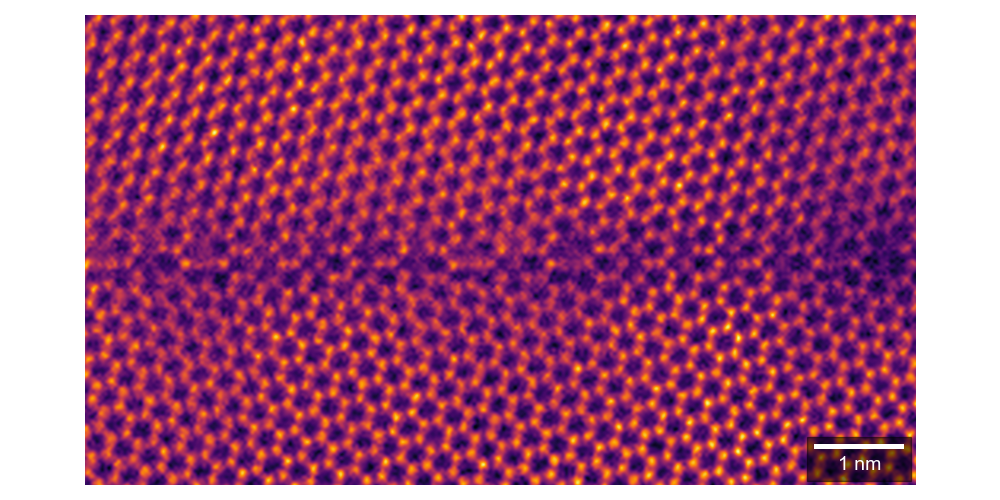

In [36]:
# Input path
path = 'Data/GB_HAADF/110a_43_ 1414 5.50 Mx HAADF-DF4-DF2-BF STEM 20201002.emd'

# Load dataset
dataset1 = hs.load(path)
haadf = dataset1[3]
haadf_sel = haadf.data[-1]

# Zoom
haadf_sel_zoomed = zoom(haadf_sel, 8)

# Smooth (Gaussian)
haadf_sel_smoothed = butterworth(haadf_sel_zoomed, cutoff_frequency_ratio=0.001)
haadf_sel_smoothed = gaussian_filter(haadf_sel_zoomed, sigma=1.4, mode='wrap')

# Rotate
haadf_sel_rotated = rotate(haadf_sel_smoothed, 90.0, resize=False)

# Crop
crop_gb, crop = 1455, 100
haadf_sel_cropped = haadf_sel_rotated[crop_gb:-crop_gb, crop:-crop-1800]

# Metadata
metadata = haadf.original_metadata
pixel_size = float(metadata.BinaryResult.PixelSize.height)  # in meters

# Plotting
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
im = ax.imshow(haadf_sel_cropped, cmap='inferno')

# Scale bar
scale = 8
scalebar = ScaleBar(pixel_size / scale, units="m", box_color="black", box_alpha=0.5,
                    color="white", location=4, font_properties={"size": 14},
                    border_pad=0.3, pad=0.5)
ax.add_artist(scalebar)

# Display and save the final image
plt.tight_layout()
plt.show()

# Save the final image
output_filename = os.path.splitext(os.path.basename(path))[0] + '_HAADF_rev01.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
fig.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi =300)

## Symmetric GB with Fe

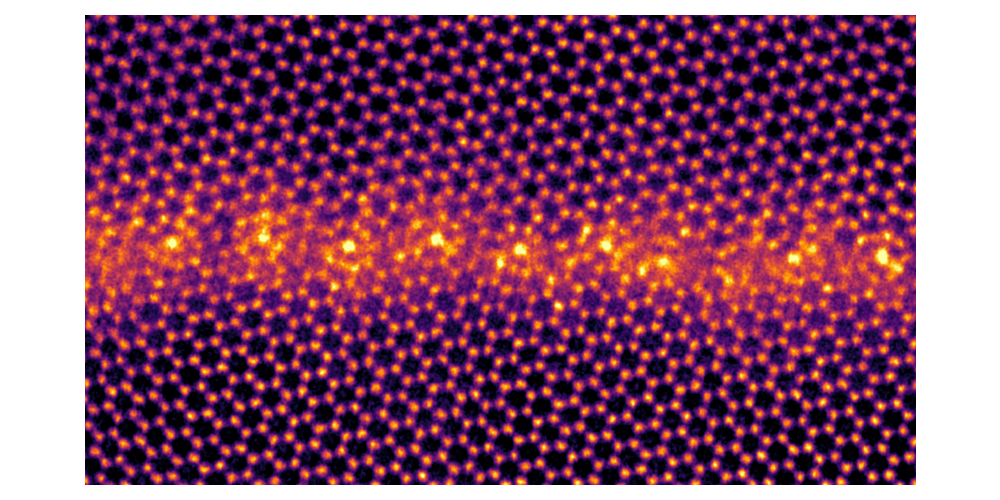

In [4]:
path = 'Data/GB_HAADF/110a_49_ 1709 HAADF 5.50 Mx STEM 20210709.emd'

directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

dataset1 = hs.load(path)
dataset1

haadf = dataset1
Nx, Ny = np.shape(haadf)

metadata = dataset1.original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

# Smooth
haadf_sel_plot = haadf.data
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.0005)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=2.2, mode='wrap', truncate=4)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.20, 0.78])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 90.0,resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 100
crop_gb = 1300
haadf_sel_plot = haadf_sel_plot[crop_gb+300:Ny-crop_gb-10,crop:Nx-crop-1800]

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
#scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 14}, border_pad = 0.3, pad = 0.5)
#ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.tight_layout()
plt.show()

# Save the figure
output_filename = os.path.splitext(os.path.basename(path))[0] + '_HAADF_wo_sb.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
fig.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

## Symmetric GB with coexistence of 'ABC' and 'cages'

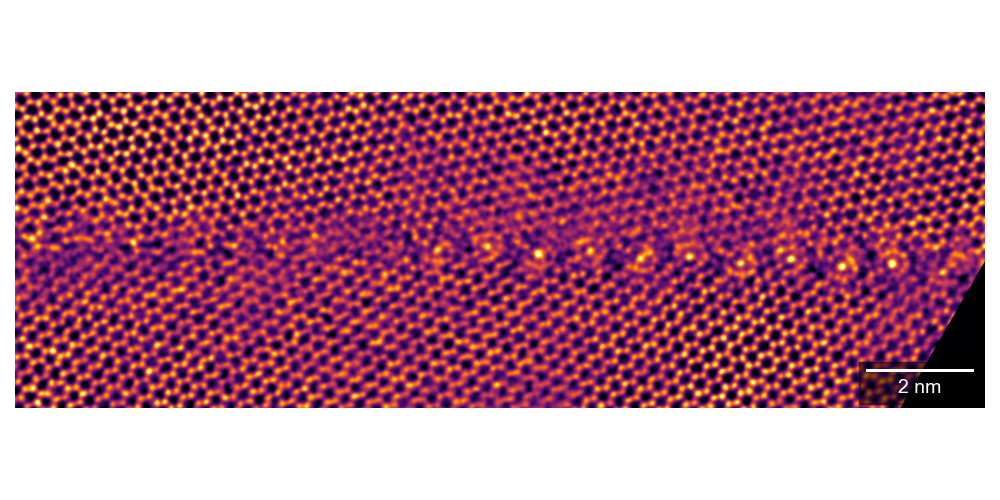

In [54]:
# Input path
folder = 'Data/GB_HAADF/'
file = '110a_49_ 1744 5.50 Mx HAADF STEM 20210720.emd'
path = os.path.join(folder, file)

# Load dataset
dataset = hs.load(path)
haadf = dataset

# Extract pixel size from metadata
metadata = haadf.original_metadata
pixel_size = float(metadata.BinaryResult.PixelSize.height)  # in meters

# Select image data
haadf_sel = haadf.data

# Rescale image (if necessary)
scale = 1
haadf_sel = rescale(haadf_sel, scale, anti_aliasing=False)

# Smooth (Butterworth and Gaussian)
haadf_sel_smoothed = butterworth(haadf_sel, cutoff_frequency_ratio=0.01)
haadf_sel_smoothed = gaussian_filter(haadf_sel_smoothed, sigma=1.9, mode='wrap')
haadf_sel_thresh = threshold(haadf_sel_smoothed, thresh_val=[0.2, 0.76])

# Rotate
rotation_angle = 60
haadf_sel_rotated = rotate(haadf_sel_thresh, rotation_angle, resize=False)

# Crop
crop_gb = 470
haadf_sel_cropped = haadf_sel_rotated[crop_gb:-crop_gb+250, :]

# Plotting
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
im = ax.imshow(haadf_sel_cropped, cmap='inferno')

# Create scale bar
scalebar = ScaleBar(pixel_size / scale, units="m", box_color="black", box_alpha=0.5,
                    color="white", location=4, font_properties={"size": 14},
                    border_pad=0.3, pad=0.5)
ax.add_artist(scalebar)

plt.axis('off')
plt.tight_layout()
plt.show()

# Save the figure
output_filename = os.path.splitext(os.path.basename(path))[0] + '_HAADF_rev01.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
fig.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

# Figure 2 - GB cage density

## Asymmetric GB with low Fe cage density

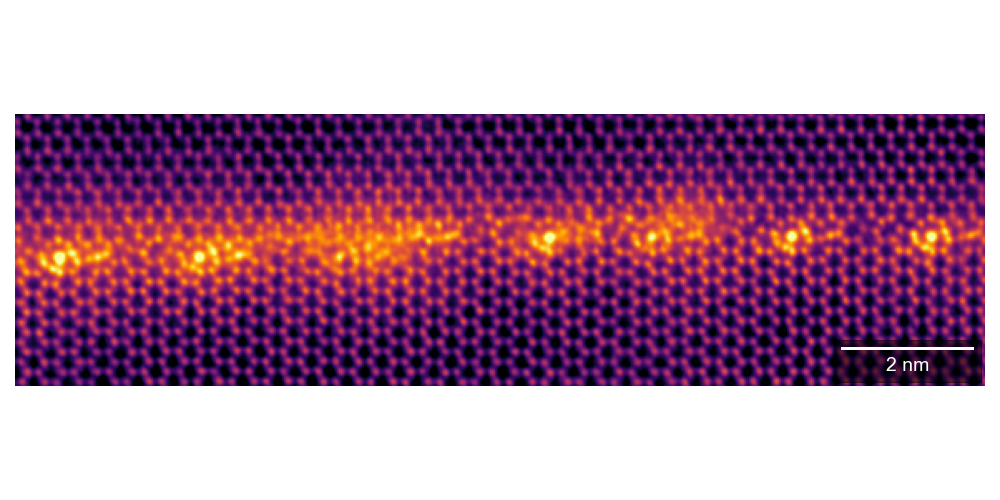

In [69]:
path = 'Data/GB_HAADF/110a_49_ 1707 3.90 Mx HAADF-DF4 STEM 20201208.emd'

directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

dataset1 = hs.load(path)
dataset1

haadf = dataset1[1] # Pick the index of DCFI image
Nz, Nx, Ny = np.shape(haadf)

metadata = dataset1[1].original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

# Smooth
haadf_sel_plot = haadf.data[-1]
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.002)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=1, mode='wrap', truncate=4)

# Threshold
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.20, 0.75])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 108.0,resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 130
crop_gb = 400
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb-60,crop:Nx-crop-180]
haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 14}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.tight_layout()
plt.show()

# Save the figure
output_filename = os.path.splitext(os.path.basename(path))[0] + '_HAADF_rev01.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
fig.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

In [25]:
plt.imshow(haadf_sel_plot[75:105, 13:43], cmap='inferno')

## Symmetric GB with higher cage density

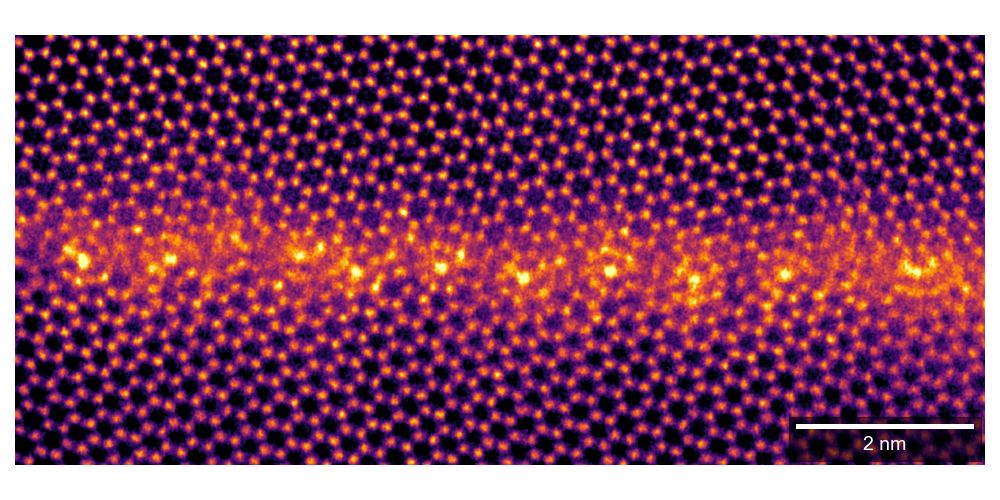

In [61]:
path = 'Data/GB_HAADF/110a_49_ 1709 HAADF 5.50 Mx STEM 20210709.emd'

directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

dataset1 = hs.load(path)
dataset1

haadf = dataset1 # Pick the index of DCFI image
Nx, Ny = np.shape(haadf)

metadata = dataset1.original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

# Smooth
haadf_sel_plot = haadf.data
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.0005)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=2, mode='wrap', truncate=4)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.20, 0.78])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 90.0,resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 10
crop_gb = 1400
haadf_sel_plot = haadf_sel_plot[crop_gb+200:Ny-crop_gb,crop:Nx-crop-1600]

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 14}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.tight_layout()
plt.show()

# Save the figure
output_filename = os.path.splitext(os.path.basename(path))[0] + '_HAADF_rev01.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
fig.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

## Asymmetric GB with further higher cage density

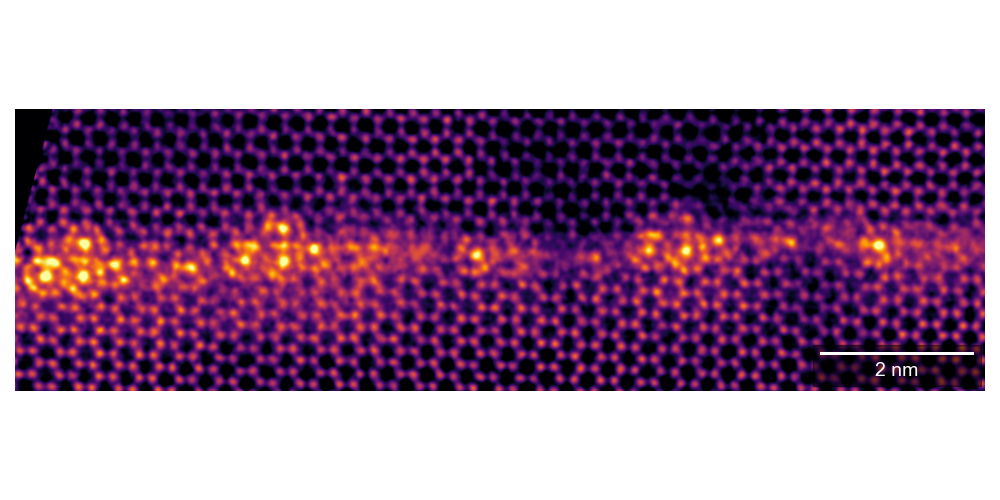

In [63]:
path = 'Data/GB_HAADF/110a_49_ 1654 7.80 Mx HAADF-DF4-DF2-BF STEM 20210720.emd'

directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

dataset1 = hs.load(path)
dataset1

haadf = dataset1[1] # Pick the index of DCFI image
Nz, Nx, Ny = np.shape(haadf)

metadata = dataset1[1].original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

# Smooth
haadf_sel_plot = haadf.data[-1]
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.0005)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=2, mode='wrap', truncate=4)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.20, 0.78])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 75.0,resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 10
crop_gb = 260
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb-210,crop:Nx-crop+20]

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 14}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.tight_layout()
plt.show()

# Save the figure
output_filename = os.path.splitext(os.path.basename(path))[0] + '_HAADF_rev01.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
fig.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

## Periodic array of cage clusters in symmetric GB

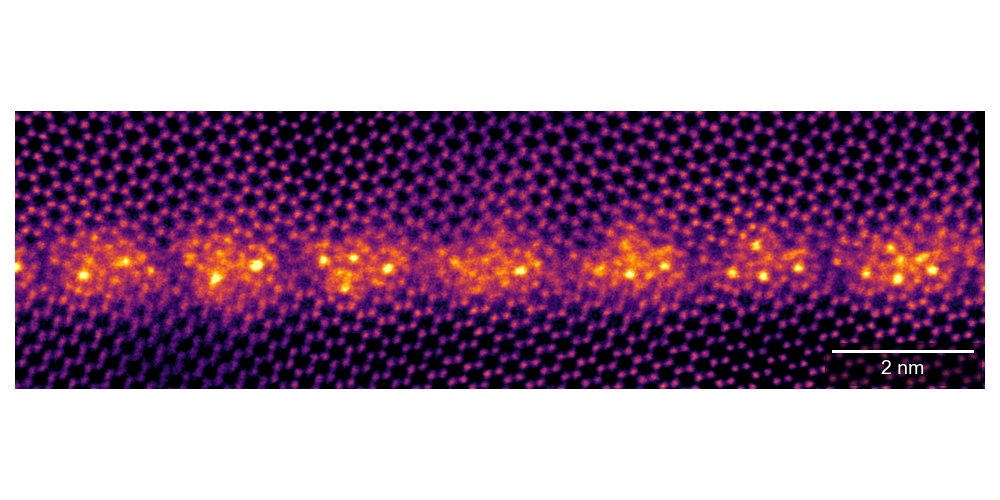

In [65]:
path = 'Data/GB_HAADF/110a_49_ 1844 HAADF 5.50 Mx STEM 20210709.emd'

directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

dataset1 = hs.load(path)
dataset1

haadf = dataset1 # Pick the index of DCFI image
Nx, Ny = np.shape(haadf)

metadata = dataset1.original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

# Smooth
haadf_sel_plot = haadf.data
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.0006)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=2, mode='wrap', truncate=4)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.20, 0.78])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 183.0,resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 1000
crop_gb = 1500
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb-210,crop:Nx-crop+1000]

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 14}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.tight_layout()
plt.show()

# Save the figure
output_filename = os.path.splitext(os.path.basename(path))[0] + '_HAADF_rev01.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
fig.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

## Experimentally observed linear cage density plot 

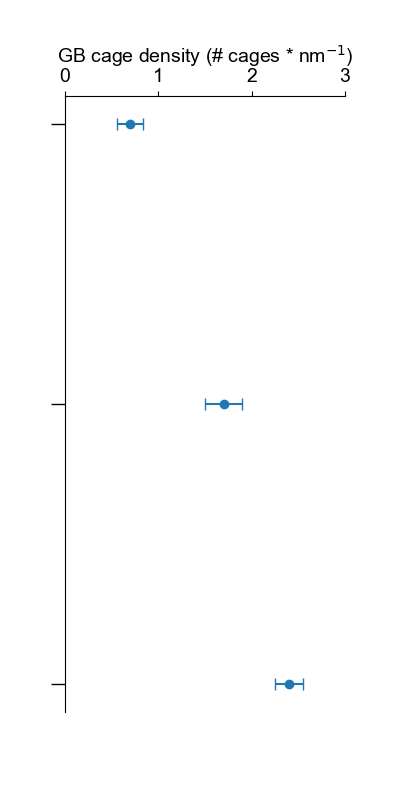

In [68]:
# GB Excess is tyically quantified in terms of Fe excess atoms per unit area of the GB. 
#This is hard to estimate so we instead measure the GB cage density and correlate it with GB excess values from the simulated images.

#cageden = [.7, .9, 1.2, 1.7, 2.4] # number of cages per nm of GB length (counted manually)
# counted number of cages for 10 nm length, then divided by 10 to get cages/nm.

# Alternatively we could calculate approximate excess by counting number of Fe atoms and divide it by the GB area.
#ex2 = 18 / (0.47 * 10) 
#ex3 = 26/ (0.47 * 10)

# Define the data points and error bars
# The error is calculated by using 1nm, 2nm and 5nm strides across the GBs.

cage_density = [0.7, 1.7, 2.4]
errors = [0.14, 0.2, 0.15]

# Create a figure and axes
fig, ax = plt.subplots(figsize=(4, 8))

plt.rcParams['font.family'] = ['arial']

# Plot the data points with reversed axes
ax.errorbar(cage_density, range(len(cage_density)), xerr=errors, fmt='o', capsize=4)

# Set the x-axis limits
ax.set_xlim(0, 3)

# Remove the bottom ticks and labels
ax.tick_params(axis='x', bottom=False)

# Set the y-tick labels
ax.set_yticks(range(len(cage_density)))
ax.set_yticklabels([])
ax.invert_yaxis()

ax.set_xlabel('GB cage density (# cages * nm$^{-1}$)', size=14, )
ax.tick_params(axis='x', labelsize=14)
ax.spines[['top']].set_visible(True)
ax.spines[['bottom', 'right']].set_visible(False)
ax.xaxis.tick_top()
ax.xaxis.set_label_position('top')
ax.tick_params(axis='y', which='major', width=1, length=10)

# Set the title
ax.set_aspect(3)

# Display the plot
plt.show()

output_filename = 'Cage_density_plot_rev01.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
plt.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

# 3. Figure 5 - f) High mag. HAADF image of a single cage

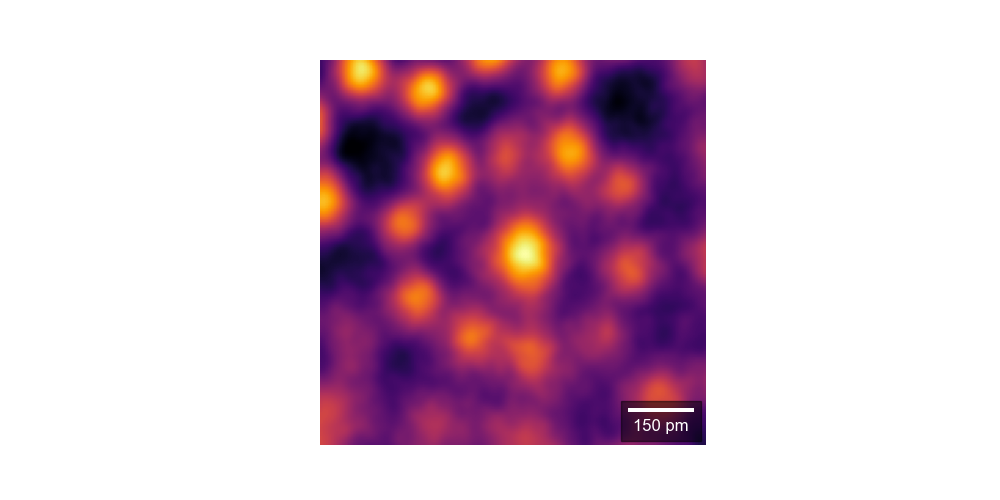

In [70]:
# Define path and directory
path = 'Data/GB_HAADF/110a_49_ 1824 15.5 Mx HAADF-DF4-DF2-BF STEM 20210719.emd'
directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

# Load dataset
dataset1 = hs.load(path)
haadf = dataset1[3]  # Select the index of the DCFI image

# Check image shape
Nz, Nx, Ny = np.shape(haadf)

# Extract pixel size from metadata
metadata = dataset1[1].original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height  # in meters
pixel_size = float(pixel_size)

# Select DCFI data
haadf_dcfi = haadf.data[-1]

# Rescale image if necessary
scale = 1

# Smooth (Butterworth and Gaussian)
haadf_sel_plot = haadf_dcfi
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.005)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=2, mode='wrap', truncate=4)

# Thresholding
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.10, 0.8])

# Rotate image
haadf_sel_plot = rotate(haadf_sel_plot, 90.0, resize=False)

# Crop image
haadf_sel_plot = haadf_sel_plot[630:770, 260:400]

# Plotting
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
im = ax.imshow(haadf_sel_plot, cmap='inferno')

# Create scale bar
scalebar = ScaleBar(pixel_size/scale, units="m", box_color="black", box_alpha=0.5,
                    color="white", location=4, font_properties={"size": 12},
                    border_pad=0.3, pad=0.5)
ax.add_artist(scalebar)

plt.axis('off')
plt.show()

output_filename = os.path.splitext(os.path.basename(path))[0] + '_HAADF_rev01.png'
output_path = os.path.join(os.path.dirname(path), output_filename)
fig.savefig(output_path, bbox_inches='tight', pad_inches=0, dpi=300)

# Sup Fig 4 - ABC-Cages - coexist

In [ ]:
folder = 'Data/GB_HAADF/'
file = '110a_49_ 1744 5.50 Mx HAADF STEM 20210720.emd'

path = folder + file
directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

dataset1 = hs.load(path)
dataset1

haadf = dataset1 # Pick the index of DCFI image
Nx, Ny = np.shape(haadf)
#haadf_av = haadf.mean()

haadf # To check if it is a signal2D image

Extract pixel size from metadata

metadata = dataset1.original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

pixel_size

haadf_sel_plot.shape

# Rescale image if necesaary (upsamling for scale > 1)
scale = 1

haadf_sel = haadf.data

# Smooth
haadf_sel_plot = haadf_sel

haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.01)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=2, mode='wrap')#, truncate=3.5)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.2, 0.73])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 60, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 0
crop_gb = 470
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb+250,crop:Nx-crop]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

## Crop for upsampled
#Ny, Nx = haadf_sel_plot.shape
#crop = 10
#crop_gb = 880
#haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb+420,crop:Nx-crop]
##haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)


#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()

# Sup Fig 5 - Single cage and double cage in a curved GB

## Sup. Fig. single - double - overview

In [85]:
folder = 'Data/GB_HAADF/'
file = '20211104 0800 110a_49 1.70 Mx STEM HAADF.emd'

path = folder + file
directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

In [77]:
dataset1 = hs.load(path)
dataset1

<Signal2D, title: HAADF, dimensions: (|2048, 2048)>

In [78]:
haadf = dataset1 # Pick the index of DCFI image
Nx, Ny = np.shape(haadf)
#haadf_av = haadf.mean()

In [79]:
haadf # To check if it is a signal2D image

<Signal2D, title: HAADF, dimensions: (|2048, 2048)>

Extract pixel size from metadata

In [80]:
metadata = dataset1.original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

In [81]:
pixel_size

2.8937807388176393e-11

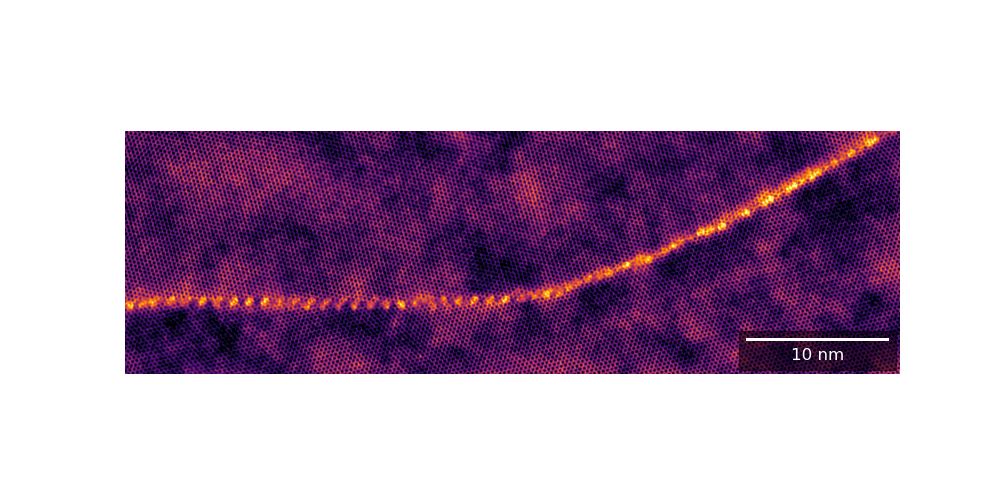

In [87]:
# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel = haadf.data

# Smooth
haadf_sel_plot = haadf_sel
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.002)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=1.0, mode='wrap') #, truncate=3.5)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.22, 0.8])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 30, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 10
crop_gb = 600
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb-260,crop:Nx-crop-150]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()

### Overview fft 

In [57]:
#FFT without image rotation performed above. Use FFT wrt original HAADF
fft = dataset1.fft(shift=True, apodization=True)
fft

<ComplexSignal2D, title: FFT of HAADF, dimensions: (|2048, 2048)>

In [69]:
fft.isig[768:1280, 768:1280]

<ComplexSignal2D, title: FFT of HAADF, dimensions: (|512, 512)>

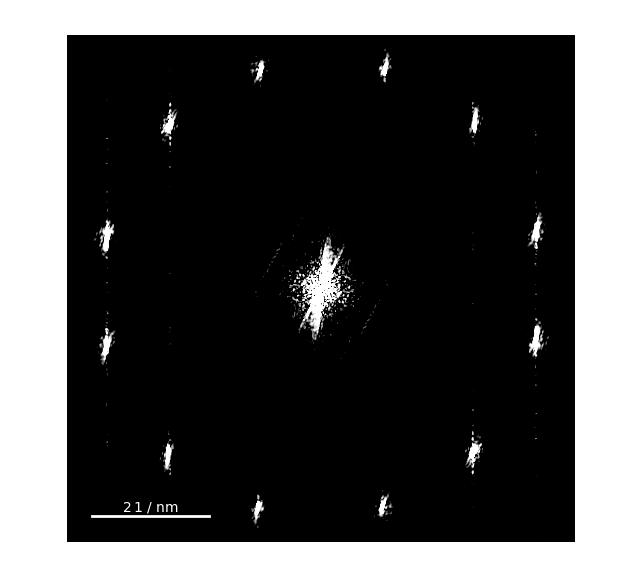

In [89]:
fft.isig[768:1280, 768:1280].plot(power_spectrum=True, vmin = 1e14, vmax=5e14, colorbar=False, scalebar=True)

# Access the current figure and axes
fig = plt.gcf()
ax = plt.gca()

ax.set_title('')
ax.set_axis_off()

fig.savefig(folder + '/' + filename_without_ext + '_fft_w_sb.png', dpi=300, bbox_inches='tight', pad_inches=0)

## Shorter segment

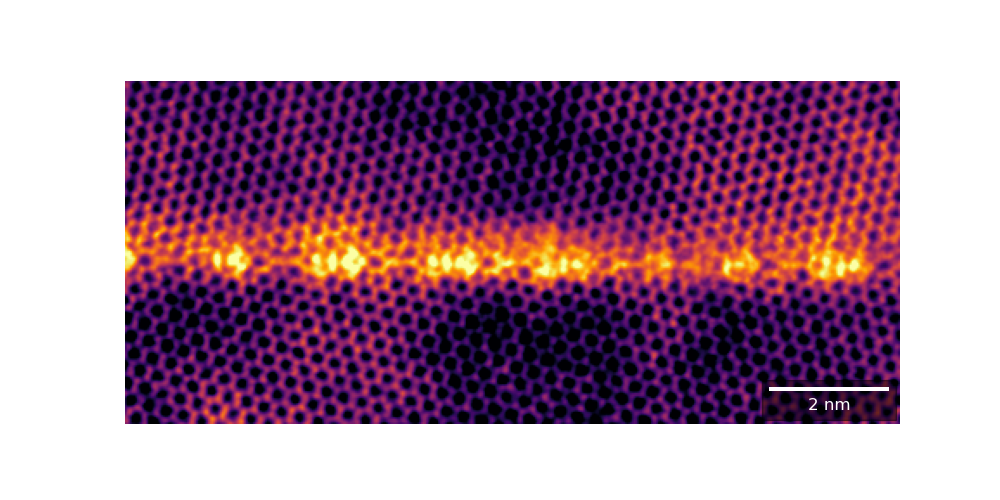

In [130]:
# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel = haadf.data

# Smooth
haadf_sel_plot = haadf_sel
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.002)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=1.0, mode='wrap')#, truncate=3.5)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.22, 0.8])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 0, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 1500
crop_gb = 970
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb+90, crop:Nx-100]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()

## Shorter section 02

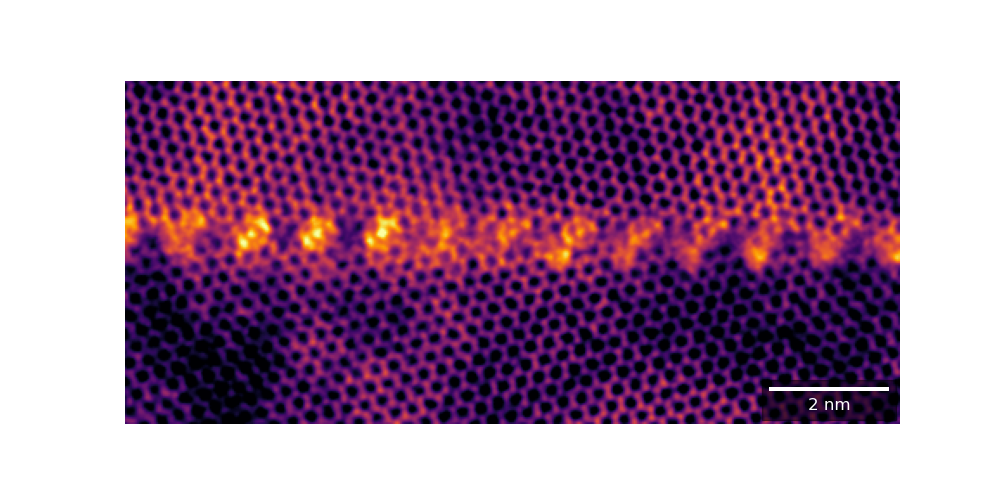

In [155]:
# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel = haadf.data

# Smooth
haadf_sel_plot = haadf_sel
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.002)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=1.0, mode='wrap')#, truncate=3.5)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.22, 0.8])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 30, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 200
crop_gb = 925
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb, crop:Nx-1400]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()

# Sup Fig 5 - Single cage and a layer of cages in a curved GB

In [152]:
folder = 'Data/GB_HAADF/'
file = '110a_49_ 1833 HAADF 980 kx STEM 20210709.emd'

path = folder + file
directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

In [153]:
dataset1 = hs.load(path)
dataset1

[<Signal2D, title: HAADF, dimensions: (20|2048, 2048)>,
 <Signal2D, title: DCFI, dimensions: (20|2048, 2048)>]

In [6]:
haadf = dataset1[1] # Pick the index of DCFI image
Nz, Nx, Ny = np.shape(haadf)
#haadf_av = haadf.mean()

In [7]:
haadf # To check if it is a signal2D image

<Signal2D, title: DCFI, dimensions: (20|2048, 2048)>

Extract pixel size from metadata

In [11]:
metadata = dataset1[1].original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

In [12]:
pixel_size

4.9809957779153273e-11

## Overview

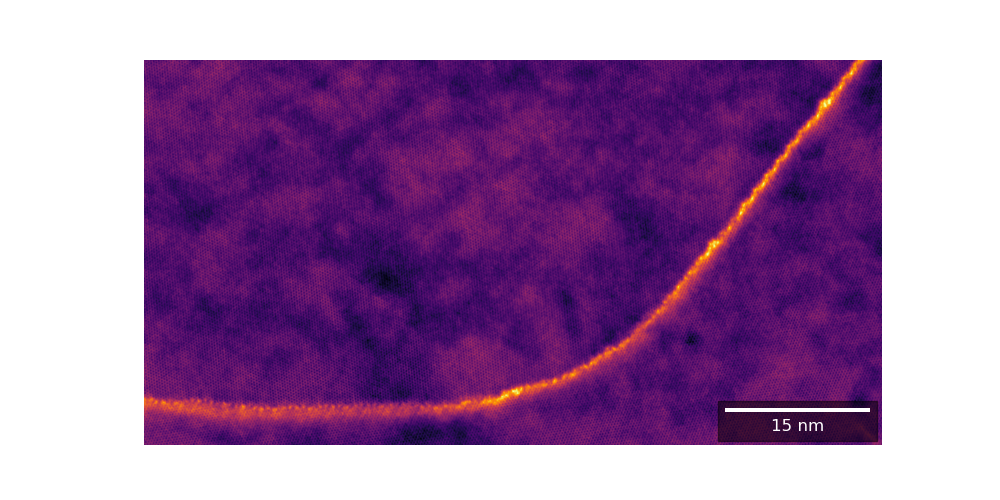

In [151]:
# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel = haadf.data[-1]

# Smooth
haadf_sel_plot = haadf_sel
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.001)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=1, mode='wrap') #, truncate=3.5)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.05, 0.82])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 100, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 100
crop_gb = 500
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb-250,crop:Nx-420]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()
## Save figure
#fig.savefig(folder + '/' + filename_without_ext + 'overview.png', dpi=300, bbox_inches='tight', pad_inches=0)

### Overview fft 

In [159]:
#FFT without image rotation performed above. Use FFT wrt original HAADF
fft = dataset1[1].fft(shift=True, apodization=True)
fft

<ComplexSignal2D, title: FFT of DCFI, dimensions: (20|2048, 2048)>

In [167]:
1024-512

512

In [160]:
fft.inav[-1].isig[512:1536, 512:1536]

<ComplexSignal2D, title: FFT of DCFI, dimensions: (|512, 512)>

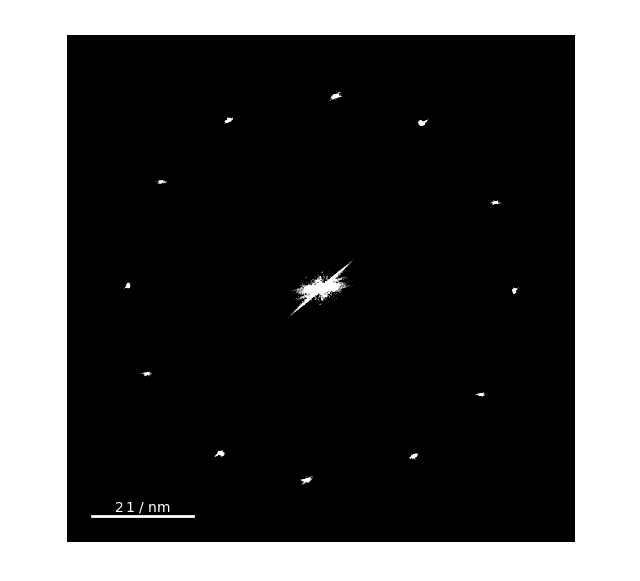

In [172]:
fft.inav[-1].isig[512:1536, 512:1536].plot(power_spectrum=True, vmin = 1e12, vmax=5e12, colorbar=False, scalebar=True)

# Access the current figure and axes
fig = plt.gcf()
ax = plt.gca()

ax.set_title('')
ax.set_axis_off()

#fig.savefig(folder + '/' + filename_without_ext + '_fft_w_sb.png', dpi=300, bbox_inches='tight', pad_inches=0)

## Single cage segment

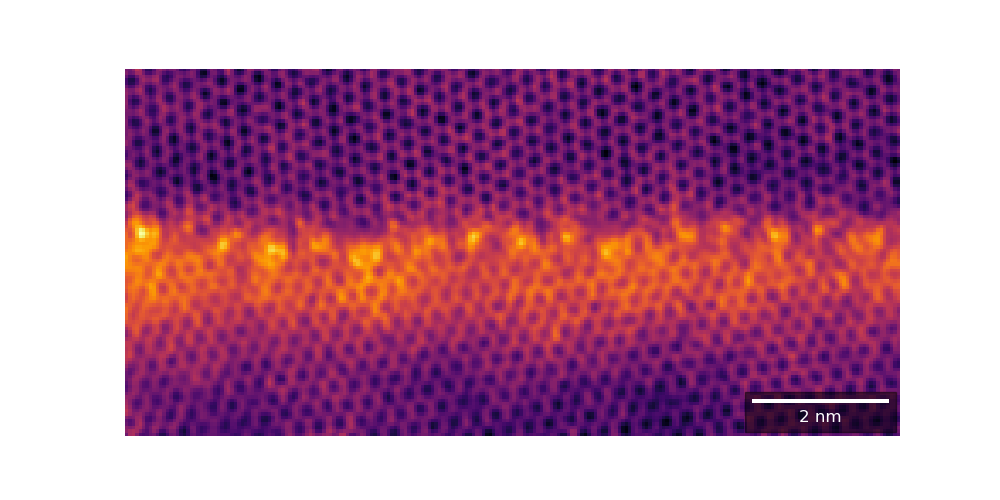

In [140]:
# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel = haadf.data[-1]

# Smooth
haadf_sel_plot = haadf_sel
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.001)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=1, mode='wrap', truncate=1)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.05, 0.68])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 100, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 300
crop_gb = 1170
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb+400,crop:Nx-1520]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()

## Save figure
#fig.savefig(folder + '/' + filename_without_ext + '_single_cage02.png', dpi=300, bbox_inches='tight', pad_inches=0)

## Layer segment

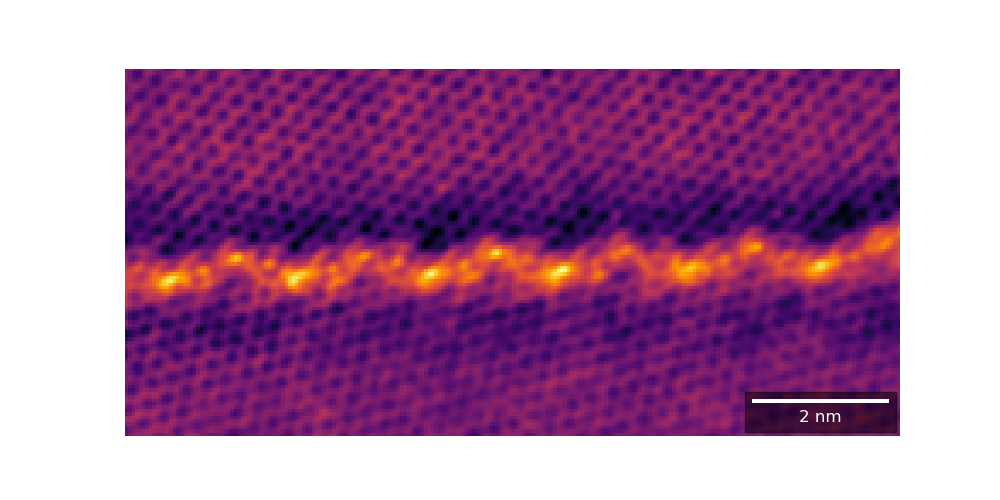

In [190]:
# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel = haadf.data[-1]

# Smooth
haadf_sel_plot = haadf_sel
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.02)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=1, mode='wrap') #, truncate=3.5)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.1, 1])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 49, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 1700
crop_gb = 1070
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb+200,crop:Nx-120]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()

# Sup Fig 5 - Cluseter of cages

In [158]:
folder = 'Data/GB_HAADF/'
file = '1600 STEM 7.80 Mx HAADF-DF4-DF2 20220704.emd'

path = folder + file
directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

In [159]:
dataset1 = hs.load(path)
dataset1

[<Signal2D, title: DF2, dimensions: (|2048, 2048)>,
 <Signal2D, title: DF4, dimensions: (|2048, 2048)>,
 <Signal2D, title: HAADF, dimensions: (|2048, 2048)>]

In [160]:
haadf = dataset1[2] # Pick the index of DCFI image
Nx, Ny = np.shape(haadf)
#haadf_av = haadf.mean()

In [161]:
haadf # To check if it is a signal2D image

<Signal2D, title: HAADF, dimensions: (|2048, 2048)>

Extract pixel size from metadata

In [162]:
metadata = dataset1[2].original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

In [163]:
pixel_size

6.226244722394159e-12

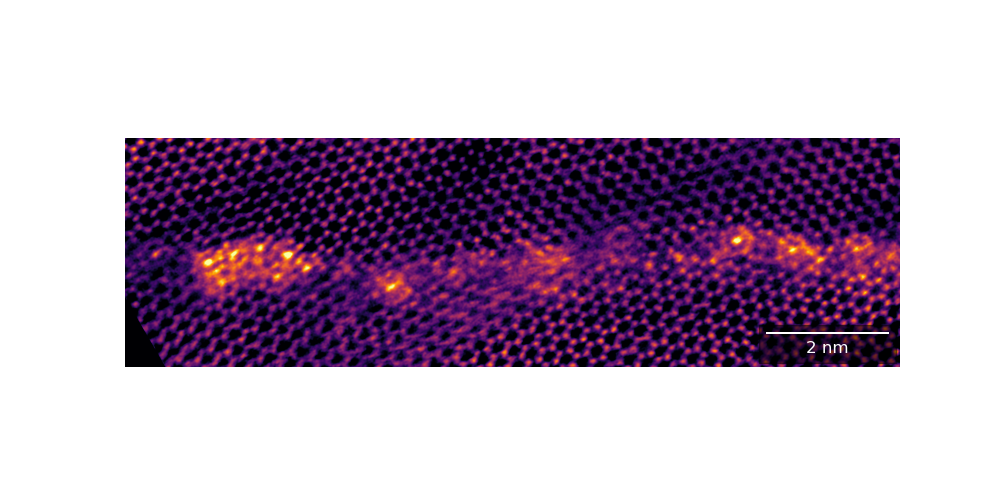

In [188]:
# Rescale image if necesaary (upsamling for scale > 1)
scale = 1
#haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel = haadf.data

# Smooth
haadf_sel_plot = haadf_sel
haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.001)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=2, mode='wrap') #, truncate=3.5)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.2, 0.75])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, 30, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 10
crop_gb = 900
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb+350,crop:Nx-crop-10]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()

## Save figure
#fig.savefig(folder + '/' + filename_without_ext + '_30rot.png', dpi=300, bbox_inches='tight', pad_inches=0)

# Atomic scale faceting

In [90]:
folder = 'Data/GB_HAADF/'
file = '110a_49_ 1717 5.50 Mx HAADF-DF4-DF2-BF STEM 20201208.emd'

path = folder + file
directory = os.path.dirname(path)
filename_without_ext = os.path.splitext(os.path.basename(path))[0]

In [91]:
dataset1 = hs.load(path)
dataset1

[<Signal2D, title: DF2, dimensions: (30|1024, 1024)>,
 <Signal2D, title: HAADF, dimensions: (30|1024, 1024)>,
 <Signal2D, title: DCFI, dimensions: (30|1024, 1024)>,
 <Signal2D, title: BF, dimensions: (30|1024, 1024)>,
 <Signal2D, title: DF4, dimensions: (30|1024, 1024)>]

In [96]:
haadf = dataset1[2].inav[-1] # Pick the index of DCFI image

In [97]:
haadf

<Signal2D, title: DCFI, dimensions: (|1024, 1024)>

In [98]:
Nx, Ny = np.shape(haadf)
#haadf_av = haadf.mean()

Extract pixel size from metadata

In [101]:
metadata = dataset1[2].inav[-1].original_metadata
pixel_size = metadata.BinaryResult.PixelSize.height #in m
pixel_size = float(pixel_size)

In [102]:
pixel_size

1.7610479458127455e-11

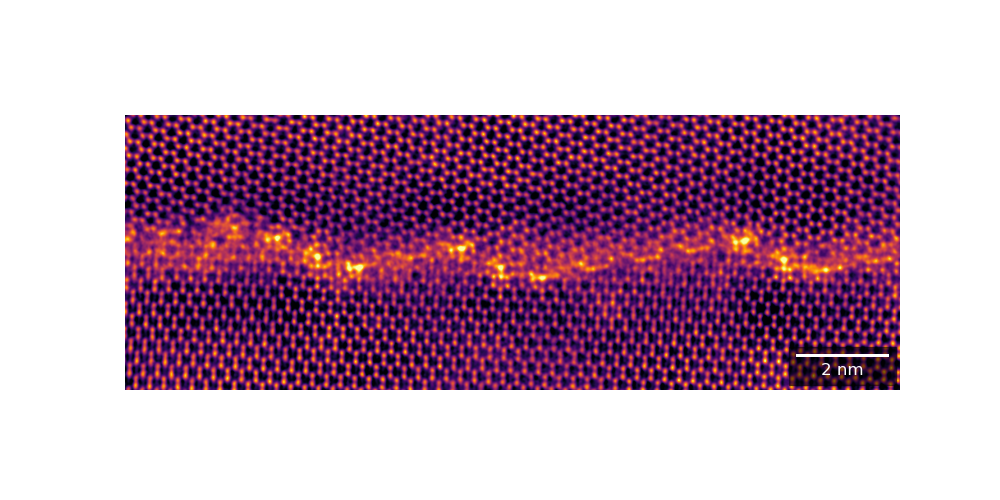

In [112]:
# Rescale image if necesaary (upsamling for scale > 1)
scale = 1

haadf_sel = haadf.data

# Smooth
haadf_sel_plot = haadf_sel

haadf_sel_plot = rescale(haadf_sel_plot, scale, anti_aliasing=False)

haadf_sel_plot = butterworth(haadf_sel_plot, cutoff_frequency_ratio=0.005)
haadf_sel_plot = gaussian(haadf_sel_plot, sigma=1.2, mode='wrap')#, truncate=3.5)

# Threshold
#haadf_sel_plot = auto_threshold(haadf_sel_plot, stddev=2)
haadf_sel_plot = threshold(haadf_sel_plot, thresh_val=[0.25, 0.80])

# Rotate
haadf_sel_plot = rotate(haadf_sel_plot, -75, resize=False)

# Crop
Ny, Nx = haadf_sel_plot.shape
crop = 40
crop_gb = 350
haadf_sel_plot = haadf_sel_plot[crop_gb:Ny-crop_gb+10,crop:Nx-crop]
#haadf_sel_plot = rotate(haadf_sel_plot, 180.0,resize=False)

#Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
ax.axis("off")
plt.imshow(haadf_sel_plot, cmap='inferno')

#Create scale bar
scalebar = ScaleBar(pixel_size/scale, units = "m", box_color = "black", box_alpha=0.5, color="white", location = 4, font_properties = {"size": 12}, border_pad = 0.3, pad = 0.5)
ax.add_artist(scalebar)

plt.axis('off')
#plt.colorbar()
plt.show()

## Save figure
#fig.savefig(folder + '/' + filename_without_ext + '_75rot_01.png', dpi=300, bbox_inches='tight', pad_inches=0)